# NN3: Implementacja momentu i normalizacji gradientu

#### Magdalena Jeczeń

wczytywanie danych

In [203]:
import numpy as np
import pandas as pd
data = pd.read_csv('./mio1/regression/square-large-training.csv')
X_train_sq_l = np.array(data.x)
y_train_sq_l = np.array(data.y)
data = pd.read_csv('./mio1/regression/square-large-test.csv')
X_test_sq_l = np.array(data.x)
y_test_sq_l = np.array(data.y)
data = pd.read_csv('./mio1/regression/steps-large-training.csv')
X_train_st_l = np.array(data.x)
y_train_st_l = np.array(data.y)
data = pd.read_csv('./mio1/regression/steps-large-test.csv')
X_test_st_l = np.array(data.x)
y_test_st_l = np.array(data.y)
data = pd.read_csv('./mio1/regression/multimodal-large-training.csv')
X_train_mm_l = np.array(data.x)
y_train_mm_l = np.array(data.y)
data = pd.read_csv('./mio1/regression/multimodal-large-test.csv')
X_test_mm_l = np.array(data.x)
y_test_mm_l = np.array(data.y)

inne funkcje

In [204]:
import matplotlib.pyplot as plt
def plot_scatter(X, y_true, y_pred, title="Scatter Plot"): # funkcja służąca do tworzenia wykresu danych prawdziwych oraz przewidzianych
    plt.scatter(X, y_true, label="Actual (y_true)", color='blue')
    plt.scatter(X, y_pred, label="Predicted (y_pred)", color='red', marker='x')
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title(title)
    plt.legend()
    plt.show()

In [205]:
def plot_multiple_mse(mse_list):
    plt.figure(figsize=(10, 6))
    
    for mse_df, label in mse_list:
        plt.plot(mse_df['Epoch'], mse_df['MSE_Train'], label=label)

    plt.xlabel('Epoch')
    plt.ylabel('MSE Train')
    plt.title('MSE Train Comparison')
    plt.legend()
    plt.show()

In [206]:
def plot_multiple_mse_log(mse_list):
    plt.figure(figsize=(10, 6))
    
    for mse_df, label in mse_list:
        plt.plot(mse_df['Epoch'], mse_df['MSE_Train'], label=label)

    plt.xlabel('Epoch')
    plt.ylabel('MSE Train')
    plt.title('MSE Train Comparison with logaritmic mse values')
    plt.yscale('log')  # Set y-axis to logarithmic scale
    plt.legend()
    plt.show()

In [207]:
import matplotlib.pyplot as plt
def plot(X,Y, title): # funkcja służąca do tworzenia wykresu danych
    plt.scatter(X, Y)
    plt.xlabel('X')
    plt.ylabel('y')
    plt.title(title)


In [806]:
import matplotlib.pyplot as plt

def plot_two(X1, Y1, X2, Y2, title = "Train and test data"):
    plt.scatter(X1, Y1, label='test')
    plt.scatter(X2, Y2, label='train')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title(title)
    plt.legend()  
    plt.show()

Sieć neuronowa

In [640]:
class Network(object):
    def __init__(self, layers_sizes, activation_function_type):
        self.weights = None
        self.biases = None
        self.weights_0 = None
        self.biases_0 = None
        
        self.mean_X = None
        self.mean_Y = None
        self.std_Y = None
        self.std_X = None
        
        self.sizes_in = layers_sizes[:-1]
        self.sizes_out = layers_sizes[1:]
        
        self.a = None
        self.z = None
        
        self.activation_function_type = activation_function_type
        
        self.mse_train = None
        
        self.mse_history = []
        
        self.velocity_weight = None
        self.velocity_bias = None
        
        self.mean_square_weight = None
        self.mean_square_bias = None
        
    def __activation_function(self, x):
        if self.activation_function_type == "sigmoid":
            return 1.0 / (1.0 + np.exp(-x))

    def __activation_function_derivative(self, x):
        if self.activation_function_type == "sigmoid":
            return self.__activation_function(np.array(x)) * (1-self.__activation_function(np.array(x)))
    
        
    def generate_weights(self, method = 'uniform'):
        if method == 'uniform':
            self.weights_0 = [np.random.rand(size_in,size_out) for (size_in,size_out) in zip(self.sizes_in,self.sizes_out)]
        if method == 'he':
            self.weights_0 = [np.random.normal(0,np.sqrt(2/(insi+outi)),size = (insi,outi)) for (insi,outi) in zip(self.sizes_in,self.sizes_out)]
            
        self.weights = self.weights_0.copy()
        
        self.z = [None]*len(self.weights)
        self.a = [None]*len(self.weights)
            
    def generate_biases(self, method = 'zeros'):
        if method == 'zeros':
            self.biases_0 = [np.zeros(size_out) for size_out in self.sizes_out]
            
        self.biases = self.biases_0.copy()
        
    def set_custom_weights(self, custom_weights):
        self.weights_0 = custom_weights.copy()
        self.weights = self.weights_0.copy()   
        
    def get_normalization_parameters(self,X,Y):
        self.mean_X = np.mean(X)
        self.std_X = np.std(X)
        self.mean_Y = np.mean(Y)
        self.std_Y = np.std(Y)
        
    def normalize_X(self,X):
        return (X - self.mean_X) / self.std_X
    
    def denormalize_Y(self, Y_pred):
        return Y_pred*self.std_Y + self.mean_Y
    
    def feedforward(self, X):
        layer = np.row_stack(self.normalize_X(X))
        self.z[0] = layer
        for i in range(len(self.weights) - 1):
            self.a[i] = layer
            layer = layer@self.weights[i] + self.biases[i]
            self.z[i+1] = layer
            layer = self.__activation_function(layer)
    
        self.a[-1] = layer
        
        Y_pred_normalized = (layer@self.weights[len(self.weights) - 1] + self.biases[len(self.weights) - 1])
        
        Y_pred_denormalized = self.denormalize_Y(np.hstack(Y_pred_normalized))
        
        return Y_pred_denormalized
    
    def MSE(self, X, Y):
        return np.mean((self.feedforward(X) - Y) ** 2)
    
    def backprop(self,X,Y):
        n = len(self.weights)
        delta_b = [np.zeros(b.shape) for b in self.biases]
        delta_w = [np.zeros(w.shape) for w in self.weights]
        delta = np.row_stack((self.feedforward(X)-Y)/len(X))
        for i in range(1,n+1):
                delta_b[-i] = np.sum(delta,axis = 0)
                delta_w[-i] = (self.a[-i].transpose())@delta
                delta = (delta@(self.weights[-i].transpose()))*self.__activation_function_derivative(self.z[-i])
        return delta_w, delta_b
   
    def Moment(self, delta_w, delta_b, alpha):
        self.velocity_bias = [alpha*prev_vel_bias + db for (prev_vel_bias,db) in zip(self.velocity_bias,delta_b)]
        self.velocity_weight = [alpha*prev_vel_weight + dw for (prev_vel_weight,dw) in zip(self.velocity_weight,delta_w)]
        return self.velocity_weight, self.velocity_bias
   
    def RMSProp(self, delta_w, delta_b, alpha):
        self.mean_square_weight = [alpha*prev_mean_sq_w + (1-alpha)*np.square(dw) for (prev_mean_sq_w,dw) in zip(self.mean_square_weight,delta_w)]
        self.mean_square_bias = [alpha*prev_mean_sq_b + (1-alpha)*np.square(db) for (prev_mean_sq_b,db) in zip(self.mean_square_bias,delta_b)]
        
        delta_w_divided = [np.divide(dw,np.sqrt(mean_sq_w)+0.000001) for (mean_sq_w,dw) in zip(self.mean_square_weight,delta_w)]
        delta_b_divided = [np.divide(db,np.sqrt(mean_sq_b)+0.000001) for (mean_sq_b,db) in zip(self.mean_square_bias,delta_b)]
        return delta_w_divided, delta_b_divided
   
    def train(self,X,Y,batch_size, eta, epochs, method = "gradient", alpha = 0.9, X_test=None, Y_test=None, shuffle = False):
        n = len(X)
        self.get_normalization_parameters(X,Y)
        self.mse_train= [None]*epochs
        
        self.velocity_weight = [np.zeros(w.shape) for w in self.weights]
        self.velocity_bias= [np.zeros(b.shape) for b in self.biases]
        self.mean_square_weight = [np.zeros(w.shape) for w in self.weights]
        self.mean_square_bias = [np.zeros(b.shape) for b in self.biases]
        
        for epoch in range(epochs):
            mini_batches = list(range(n))
            if shuffle:
                np.random.shuffle(mini_batches)
            for i in range(0,n,batch_size):
                mini_batch = mini_batches[i:i+batch_size]
                delta_w, delta_b = self.backprop(X[mini_batch],Y[mini_batch])
                if method == "moment":
                    delta_w, delta_b = self.Moment(delta_w, delta_b, alpha)
                elif method == "RMSProp":
                    delta_w, delta_b = self.RMSProp(delta_w,delta_b,alpha)
                
                self.weights = [w- eta*dw for (w,dw) in zip(self.weights,delta_w)]
                self.biases = [b- eta*db for (b,db) in zip(self.biases,delta_b)]    
            
            mse = self.MSE(X, Y)
            self.mse_history.append((epoch, mse))
            
            print("Epoch {0} complete, mse: {1}".format(epoch, mse))
            
        if X_test is not None and Y_test is not None:
            print("MSE for test: ", self.MSE(X_test, Y_test))
        
            
        return self.MSE(X_test, Y_test)
    

    

### MSE wymagane w poleceniu

##### Multimodal - large

In [215]:
net_mm_l_moment = Network([1,10,1], "sigmoid")

In [355]:
net_mm_l_moment.generate_weights("uniform")
net_mm_l_moment.generate_biases("zeros")

In [217]:
net_mm_l_moment.train(X_train_mm_l, y_train_mm_l, 100, 0.001, 3000, shuffle=True, X_test = X_test_mm_l, Y_test=y_test_mm_l, method="moment", alpha=0.9)

Epoch 0 complete, mse: 3965.6550924084468
Epoch 1 complete, mse: 3644.574398437211
Epoch 2 complete, mse: 2949.133880246543
Epoch 3 complete, mse: 2476.762008426349
Epoch 4 complete, mse: 2320.344828942192
Epoch 5 complete, mse: 2244.499743704678
Epoch 6 complete, mse: 2198.808280171191
Epoch 7 complete, mse: 2121.1203010488452
Epoch 8 complete, mse: 2129.6185597115873
Epoch 9 complete, mse: 1992.689292780653
Epoch 10 complete, mse: 1954.8574611740491
Epoch 11 complete, mse: 1964.1587004765565
Epoch 12 complete, mse: 1916.8052832418527
Epoch 13 complete, mse: 1903.604327763655
Epoch 14 complete, mse: 1856.5851290515754
Epoch 15 complete, mse: 1869.039693670405
Epoch 16 complete, mse: 1832.0313781155721
Epoch 17 complete, mse: 1798.5760689553294
Epoch 18 complete, mse: 1780.6992438376956
Epoch 19 complete, mse: 1757.204630302687
Epoch 20 complete, mse: 1748.5122890718035
Epoch 21 complete, mse: 1713.2128507707298
Epoch 22 complete, mse: 1672.6969037991805
Epoch 23 complete, mse: 1647.32

6.770157194289296

In [261]:
print("Zbiór multimodal-large, MSE dla zbioru testowego: ", net_mm_l_moment.MSE(X_test_mm_l, y_test_mm_l))

Zbiór multimodal-large, MSE dla zbioru testowego:  6.770157194289296


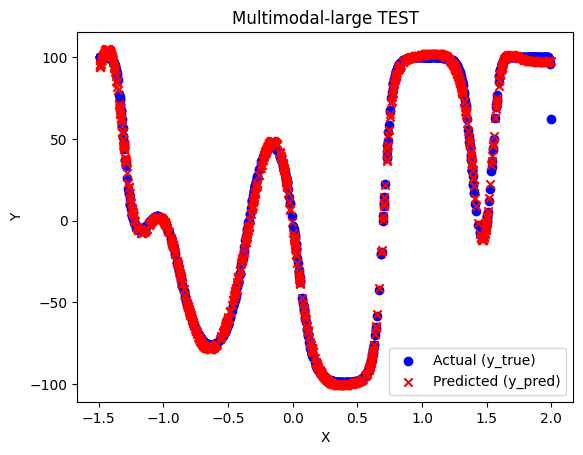

In [257]:
plot_scatter(X_test_mm_l, y_test_mm_l, net_mm_l_moment.feedforward(X_test_mm_l), "Multimodal-large TEST")

##### Steps - large

In [591]:
net_st_l_moment = Network([1,5,5,5,1], "sigmoid")

In [592]:
net_st_l_moment.generate_weights("he")
net_st_l_moment.generate_biases("zeros")

hubabuba


In [612]:
net_st_l_moment.weights_0

[array([[-0.46877406,  0.1481068 ,  0.0743145 , -0.25701425,  0.35461943]]),
 array([[-0.78159919,  0.02181711,  0.40321493, -0.42057349,  0.0718858 ],
        [ 0.05109753, -0.52456599,  0.06916659, -0.26111818, -0.90652252],
        [ 0.21226921, -0.03300131,  0.67275085, -0.18572837, -0.69993675],
        [ 0.45767494, -0.25668845,  0.18190462, -0.02088095,  0.72331314],
        [ 0.15439103,  0.02903356, -0.1922479 , -0.51642629, -0.15105768]]),
 array([[-0.49259612, -0.33671866, -0.92100037, -0.19457837, -0.00532013],
        [-0.19773916, -0.80710978,  0.06451981,  0.06026531, -0.19836837],
        [-0.42231679,  0.13295915, -0.23409658, -0.1998103 ,  0.43109416],
        [-0.79771602,  0.63339822, -0.14663176,  0.47930734, -0.24613944],
        [ 0.45797015, -0.43053628,  0.52302023, -0.18518758,  0.47783798]]),
 array([[ 0.2809866 ],
        [ 0.50976187],
        [ 0.38294141],
        [-0.17240981],
        [-0.49974134]])]

In [594]:
net_st_l_moment.train(X_train_st_l, y_train_st_l, 100, 0.01, 10000, shuffle=False, X_test = X_test_st_l, Y_test=y_test_st_l, method="moment", alpha=0.9)

Epoch 0 complete, mse: 1481.1407584064898
Epoch 1 complete, mse: 815.5638807394848
Epoch 2 complete, mse: 651.6289242138729
Epoch 3 complete, mse: 560.1954615419348
Epoch 4 complete, mse: 492.94960499285776
Epoch 5 complete, mse: 476.510231333567
Epoch 6 complete, mse: 467.16611427374903
Epoch 7 complete, mse: 452.69974757242164
Epoch 8 complete, mse: 428.72406343817573
Epoch 9 complete, mse: 403.9044898293711
Epoch 10 complete, mse: 386.53782971375057
Epoch 11 complete, mse: 364.95059362777965
Epoch 12 complete, mse: 342.6439064139061
Epoch 13 complete, mse: 318.2495100747194
Epoch 14 complete, mse: 291.3703460652582
Epoch 15 complete, mse: 266.30317312723093
Epoch 16 complete, mse: 244.62432004462298
Epoch 17 complete, mse: 226.02227207428456
Epoch 18 complete, mse: 209.66462138441102
Epoch 19 complete, mse: 194.92746673567603
Epoch 20 complete, mse: 181.83770690073274
Epoch 21 complete, mse: 170.76226732456368
Epoch 22 complete, mse: 161.58245923739312
Epoch 23 complete, mse: 153.52

0.9427801717397638

In [802]:
print("Zbiór steps-large, MSE dla zbioru testowego: ", 0.9427801717397638)

Zbiór steps-large, MSE dla zbioru testowego:  0.9427801717397638


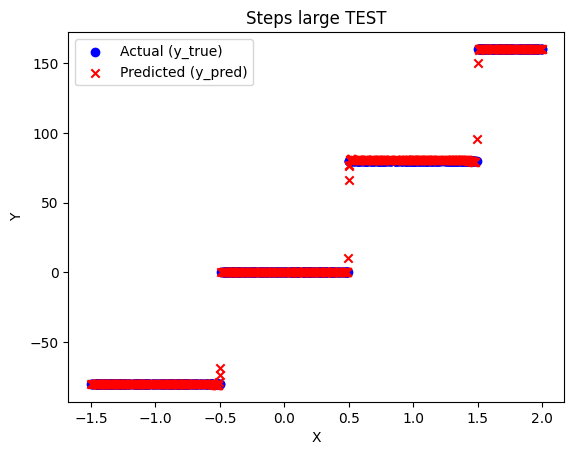

In [595]:
plot_scatter(X_test_st_l, y_test_st_l, net_st_l_moment.feedforward(X_test_st_l), "Steps large TEST")

##### Square - large

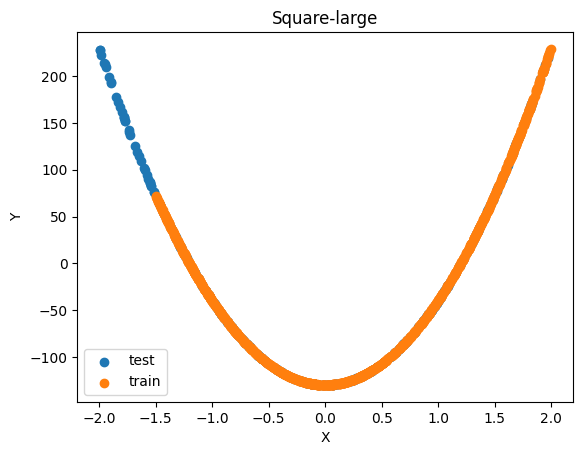

In [807]:
plot_two( X_test_sq_l, y_test_sq_l, X_train_sq_l, y_train_sq_l,"Square-large")

Widzimy, że lewa część wykresu danych testowych w ogóle nie występuje w danych treningowych. W związku z tym, wytrenowanie modelu, tak aby MSE na zbiorze testowym było zbliżone do MSE na zbiorze treningowym będzie trudne.

In [721]:
net_sq_l = Network([1,5,5,1], "sigmoid")

In [722]:
net_sq_l.generate_weights("he")
net_sq_l.generate_biases("zeros")

In [723]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.01, 5000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.9)

Epoch 0 complete, mse: 6546.280636219609
Epoch 1 complete, mse: 2693.129196129201
Epoch 2 complete, mse: 2564.370990105079
Epoch 3 complete, mse: 1889.4915437446828
Epoch 4 complete, mse: 1099.529406161486
Epoch 5 complete, mse: 697.9355027850427
Epoch 6 complete, mse: 278.1692994902767
Epoch 7 complete, mse: 168.52542171996265
Epoch 8 complete, mse: 68.67753900296165
Epoch 9 complete, mse: 71.8995791505787
Epoch 10 complete, mse: 67.70897264555275
Epoch 11 complete, mse: 27.248997640105166
Epoch 12 complete, mse: 28.012027962836278
Epoch 13 complete, mse: 31.7419780559277
Epoch 14 complete, mse: 32.721184580536004
Epoch 15 complete, mse: 17.772147130816876
Epoch 16 complete, mse: 24.538567499759356
Epoch 17 complete, mse: 22.670897072019688
Epoch 18 complete, mse: 56.85020585839263
Epoch 19 complete, mse: 57.55400580145116
Epoch 20 complete, mse: 51.48691060213475
Epoch 21 complete, mse: 33.169085841539314
Epoch 22 complete, mse: 9.713472787364429
Epoch 23 complete, mse: 9.81928084431

34.71013470829203

In [724]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.005, 5000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.9)

Epoch 0 complete, mse: 0.008718658994502852
Epoch 1 complete, mse: 0.008795327745974284
Epoch 2 complete, mse: 0.01135279033167814
Epoch 3 complete, mse: 0.011464722240162354
Epoch 4 complete, mse: 0.01084121778254632
Epoch 5 complete, mse: 0.0086590697092755
Epoch 6 complete, mse: 0.008707882027108729
Epoch 7 complete, mse: 0.00930531517111907
Epoch 8 complete, mse: 0.009727841997915642
Epoch 9 complete, mse: 0.009672186343177023
Epoch 10 complete, mse: 0.008606267389222884
Epoch 11 complete, mse: 0.009387648774977513
Epoch 12 complete, mse: 0.011223033899444929
Epoch 13 complete, mse: 0.009504377549682537
Epoch 14 complete, mse: 0.009246429369517873
Epoch 15 complete, mse: 0.009165809769831437
Epoch 16 complete, mse: 0.009502005608901316
Epoch 17 complete, mse: 0.008610973854495467
Epoch 18 complete, mse: 0.009317696588469076
Epoch 19 complete, mse: 0.012622318881791699
Epoch 20 complete, mse: 0.010519794336661214
Epoch 21 complete, mse: 0.00939916090070939
Epoch 22 complete, mse: 0.

29.060398277690304

In [725]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.005, 5000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.9)

Epoch 0 complete, mse: 0.0063813824321317155
Epoch 1 complete, mse: 0.005903273936638069
Epoch 2 complete, mse: 0.006218343433779922
Epoch 3 complete, mse: 0.006083423005397734
Epoch 4 complete, mse: 0.00881894683372874
Epoch 5 complete, mse: 0.006258176076712438
Epoch 6 complete, mse: 0.008607024198382655
Epoch 7 complete, mse: 0.009069820987516608
Epoch 8 complete, mse: 0.010467113677254248
Epoch 9 complete, mse: 0.005883875261090034
Epoch 10 complete, mse: 0.006571462058801781
Epoch 11 complete, mse: 0.006572108898132639
Epoch 12 complete, mse: 0.006551051764492474
Epoch 13 complete, mse: 0.006398123051184938
Epoch 14 complete, mse: 0.007736965521973204
Epoch 15 complete, mse: 0.006386564780235148
Epoch 16 complete, mse: 0.00810834357739949
Epoch 17 complete, mse: 0.006077247267961106
Epoch 18 complete, mse: 0.00798410734507752
Epoch 19 complete, mse: 0.005792998475638751
Epoch 20 complete, mse: 0.0062706258533209314
Epoch 21 complete, mse: 0.00777920497054277
Epoch 22 complete, mse

25.363316211263893

In [726]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.004, 5000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.95)

Epoch 0 complete, mse: 0.004695756719071026
Epoch 1 complete, mse: 0.004586039956758786
Epoch 2 complete, mse: 0.004256540434200069
Epoch 3 complete, mse: 0.0042215812547692026
Epoch 4 complete, mse: 0.0043751343522846825
Epoch 5 complete, mse: 0.004335307256395048
Epoch 6 complete, mse: 0.005385862148589267
Epoch 7 complete, mse: 0.009353308630784596
Epoch 8 complete, mse: 0.010016487664385697
Epoch 9 complete, mse: 0.011180533233707095
Epoch 10 complete, mse: 0.007833480276960736
Epoch 11 complete, mse: 0.00850321638509045
Epoch 12 complete, mse: 0.0058528060437893995
Epoch 13 complete, mse: 0.00467882758300619
Epoch 14 complete, mse: 0.005500866154771465
Epoch 15 complete, mse: 0.0053965577655635585
Epoch 16 complete, mse: 0.004910388888673678
Epoch 17 complete, mse: 0.007423871558273453
Epoch 18 complete, mse: 0.004445518982826183
Epoch 19 complete, mse: 0.00492950791947368
Epoch 20 complete, mse: 0.00490012227209241
Epoch 21 complete, mse: 0.004318482564525501
Epoch 22 complete, m

21.6639703293657

In [727]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.003, 5000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.95)

Epoch 0 complete, mse: 0.002839796078092145
Epoch 1 complete, mse: 0.002909402230670936
Epoch 2 complete, mse: 0.0033572886301376998
Epoch 3 complete, mse: 0.0031615200648437247
Epoch 4 complete, mse: 0.003380820359321803
Epoch 5 complete, mse: 0.0029122377575045164
Epoch 6 complete, mse: 0.002745200304743938
Epoch 7 complete, mse: 0.002989254561781194
Epoch 8 complete, mse: 0.003254810551577224
Epoch 9 complete, mse: 0.0036850095674628366
Epoch 10 complete, mse: 0.0037514834053449077
Epoch 11 complete, mse: 0.004644000455237128
Epoch 12 complete, mse: 0.003197335663296044
Epoch 13 complete, mse: 0.0036830929063694294
Epoch 14 complete, mse: 0.002785855797366807
Epoch 15 complete, mse: 0.0032278966311446587
Epoch 16 complete, mse: 0.0034576952565947704
Epoch 17 complete, mse: 0.00333583311777577
Epoch 18 complete, mse: 0.003788464135139692
Epoch 19 complete, mse: 0.002878297145517607
Epoch 20 complete, mse: 0.0026953851202029915
Epoch 21 complete, mse: 0.00391714961630554
Epoch 22 comp

19.561780669225232

In [728]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.003, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.95)

Epoch 0 complete, mse: 0.002075069904635698
Epoch 1 complete, mse: 0.002554569381635242
Epoch 2 complete, mse: 0.002681464798412926
Epoch 3 complete, mse: 0.00200281956535657
Epoch 4 complete, mse: 0.0023845702254453286
Epoch 5 complete, mse: 0.0020203541041187018
Epoch 6 complete, mse: 0.0020786708984342965
Epoch 7 complete, mse: 0.002224237281738137
Epoch 8 complete, mse: 0.0024153635514329065
Epoch 9 complete, mse: 0.0023597323680538853
Epoch 10 complete, mse: 0.002404949601332399
Epoch 11 complete, mse: 0.003884617860727901
Epoch 12 complete, mse: 0.002636962723069358
Epoch 13 complete, mse: 0.002367269316961297
Epoch 14 complete, mse: 0.0024097678617826493
Epoch 15 complete, mse: 0.001987335535860244
Epoch 16 complete, mse: 0.002375977560782269
Epoch 17 complete, mse: 0.0018757843753572834
Epoch 18 complete, mse: 0.0021920847456390097
Epoch 19 complete, mse: 0.002276340795459258
Epoch 20 complete, mse: 0.00278422209350382
Epoch 21 complete, mse: 0.002074979826926114
Epoch 22 compl

16.75202356677758

In [730]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.003, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.95)

Epoch 0 complete, mse: 0.001327569497362453
Epoch 1 complete, mse: 0.0011345758886084636
Epoch 2 complete, mse: 0.0013227497469341766
Epoch 3 complete, mse: 0.0013694408817118235
Epoch 4 complete, mse: 0.001627907856902161
Epoch 5 complete, mse: 0.0022549511273263195
Epoch 6 complete, mse: 0.0012549292636949655
Epoch 7 complete, mse: 0.0014071870973367084
Epoch 8 complete, mse: 0.0020599313507953685
Epoch 9 complete, mse: 0.002537380693160576
Epoch 10 complete, mse: 0.0013250977721627972
Epoch 11 complete, mse: 0.0019387546530311571
Epoch 12 complete, mse: 0.0021051561175818244
Epoch 13 complete, mse: 0.0012315597075136765
Epoch 14 complete, mse: 0.0012306962168013955
Epoch 15 complete, mse: 0.0018973587971634319
Epoch 16 complete, mse: 0.003240201357335462
Epoch 17 complete, mse: 0.001170534294266838
Epoch 18 complete, mse: 0.0021058676514351497
Epoch 19 complete, mse: 0.002931772882133112
Epoch 20 complete, mse: 0.001435592137246191
Epoch 21 complete, mse: 0.0016222292965113118
Epoch

14.956898284458845

In [731]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.95)

Epoch 0 complete, mse: 0.0008044283951504047
Epoch 1 complete, mse: 0.0008111845054020088
Epoch 2 complete, mse: 0.0007499070814081282
Epoch 3 complete, mse: 0.0007409017069745702
Epoch 4 complete, mse: 0.0007281737848469581
Epoch 5 complete, mse: 0.0007912614628829634
Epoch 6 complete, mse: 0.0007314149084323227
Epoch 7 complete, mse: 0.0007940490576323685
Epoch 8 complete, mse: 0.0007917363209490547
Epoch 9 complete, mse: 0.0007655951560132803
Epoch 10 complete, mse: 0.0007363196233810618
Epoch 11 complete, mse: 0.0007348531005426193
Epoch 12 complete, mse: 0.000784247090005232
Epoch 13 complete, mse: 0.0007957211239336635
Epoch 14 complete, mse: 0.0007667588631968469
Epoch 15 complete, mse: 0.0007848349766814977
Epoch 16 complete, mse: 0.000811653640552858
Epoch 17 complete, mse: 0.0007444371157589078
Epoch 18 complete, mse: 0.0007503965593922415
Epoch 19 complete, mse: 0.0007282667734687986
Epoch 20 complete, mse: 0.000790229836598809
Epoch 21 complete, mse: 0.0008229717923354549
E

14.57941886421628

In [732]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0009349654781651328
Epoch 1 complete, mse: 0.0008465811513189711
Epoch 2 complete, mse: 0.0007798682226529378
Epoch 3 complete, mse: 0.000683480585627745
Epoch 4 complete, mse: 0.0008556723709949005
Epoch 5 complete, mse: 0.0008661332146428056
Epoch 6 complete, mse: 0.0009963561865420553
Epoch 7 complete, mse: 0.0007993076802819938
Epoch 8 complete, mse: 0.0007710159809430046
Epoch 9 complete, mse: 0.0006588035203358252
Epoch 10 complete, mse: 0.0006548639306741082
Epoch 11 complete, mse: 0.0006556139895717547
Epoch 12 complete, mse: 0.0006935352353364765
Epoch 13 complete, mse: 0.0007073083299437941
Epoch 14 complete, mse: 0.0006878783767495069
Epoch 15 complete, mse: 0.0007175173065704425
Epoch 16 complete, mse: 0.0009400651112702634
Epoch 17 complete, mse: 0.0007176010107028141
Epoch 18 complete, mse: 0.0006989683271138792
Epoch 19 complete, mse: 0.0007019715653031965
Epoch 20 complete, mse: 0.0007778448838363849
Epoch 21 complete, mse: 0.0009090844791014376

13.94988824351567

In [733]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0005731995831271613
Epoch 1 complete, mse: 0.0005759350464968965
Epoch 2 complete, mse: 0.0005670067476755471
Epoch 3 complete, mse: 0.0005654723246582385
Epoch 4 complete, mse: 0.0006278783873683524
Epoch 5 complete, mse: 0.0005789901815295263
Epoch 6 complete, mse: 0.0005734239744275152
Epoch 7 complete, mse: 0.0005708603561226432
Epoch 8 complete, mse: 0.0005951313592255314
Epoch 9 complete, mse: 0.0005858471997858684
Epoch 10 complete, mse: 0.0006455974289080224
Epoch 11 complete, mse: 0.0006951964570834728
Epoch 12 complete, mse: 0.0006445250748999034
Epoch 13 complete, mse: 0.0007341449633353368
Epoch 14 complete, mse: 0.0006752971803052956
Epoch 15 complete, mse: 0.0006792153788302606
Epoch 16 complete, mse: 0.0006604870361200085
Epoch 17 complete, mse: 0.000808882271430333
Epoch 18 complete, mse: 0.0009281260084053312
Epoch 19 complete, mse: 0.0007455190635963339
Epoch 20 complete, mse: 0.00071805744140763
Epoch 21 complete, mse: 0.0006279066999713555
E

13.44285527531516

In [735]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.002, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0006714691291388095
Epoch 1 complete, mse: 0.0006545181934162255
Epoch 2 complete, mse: 0.0005224030180081133
Epoch 3 complete, mse: 0.0006300920226545422
Epoch 4 complete, mse: 0.0006320245614543396
Epoch 5 complete, mse: 0.0006332121109941056
Epoch 6 complete, mse: 0.000619283735660037
Epoch 7 complete, mse: 0.000790175758926828
Epoch 8 complete, mse: 0.0005655760536042591
Epoch 9 complete, mse: 0.0008789868663569311
Epoch 10 complete, mse: 0.0008816997536399952
Epoch 11 complete, mse: 0.0006104061462393236
Epoch 12 complete, mse: 0.0006428972177889924
Epoch 13 complete, mse: 0.001373459908662083
Epoch 14 complete, mse: 0.0008330557577273312
Epoch 15 complete, mse: 0.0005038190453163014
Epoch 16 complete, mse: 0.0007064648787272008
Epoch 17 complete, mse: 0.0007360580744727817
Epoch 18 complete, mse: 0.000524978593155092
Epoch 19 complete, mse: 0.0008501182028875559
Epoch 20 complete, mse: 0.0006751441596234706
Epoch 21 complete, mse: 0.0005126436619077914
Ep

12.72511311233075

In [737]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.004, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0004631610875222155
Epoch 1 complete, mse: 0.0005241323979243341
Epoch 2 complete, mse: 0.000446571444501616
Epoch 3 complete, mse: 0.0011754529868267176
Epoch 4 complete, mse: 0.0008223652730254247
Epoch 5 complete, mse: 0.0006767565362917568
Epoch 6 complete, mse: 0.00044475127718988873
Epoch 7 complete, mse: 0.0004917618281872901
Epoch 8 complete, mse: 0.0004888038328670383
Epoch 9 complete, mse: 0.000532241035321937
Epoch 10 complete, mse: 0.00044743286605705186
Epoch 11 complete, mse: 0.000866117735752115
Epoch 12 complete, mse: 0.0005393475624501983
Epoch 13 complete, mse: 0.0004976552075415478
Epoch 14 complete, mse: 0.0015662295572237564
Epoch 15 complete, mse: 0.0011294858344746026
Epoch 16 complete, mse: 0.0007199223797357909
Epoch 17 complete, mse: 0.0006346069546150095
Epoch 18 complete, mse: 0.000639410463818926
Epoch 19 complete, mse: 0.000786757961786611
Epoch 20 complete, mse: 0.0004710317609076338
Epoch 21 complete, mse: 0.0005580436307013018
E

11.836287136022849

In [738]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.004, 15000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0005061686651143307
Epoch 1 complete, mse: 0.00043004023447597517
Epoch 2 complete, mse: 0.0004032134537420351
Epoch 3 complete, mse: 0.00048021599061487895
Epoch 4 complete, mse: 0.00041720685119205455
Epoch 5 complete, mse: 0.00036148665781184596
Epoch 6 complete, mse: 0.0005149029768930877
Epoch 7 complete, mse: 0.0003770696101959377
Epoch 8 complete, mse: 0.0005709132612195793
Epoch 9 complete, mse: 0.0013129982919529966
Epoch 10 complete, mse: 0.001101728814490163
Epoch 11 complete, mse: 0.001296775344029798
Epoch 12 complete, mse: 0.0012966855762736212
Epoch 13 complete, mse: 0.0009748282028889847
Epoch 14 complete, mse: 0.000947014621549578
Epoch 15 complete, mse: 0.0008026441346628509
Epoch 16 complete, mse: 0.000510995717129586
Epoch 17 complete, mse: 0.0006245601193901999
Epoch 18 complete, mse: 0.0009909488165162428
Epoch 19 complete, mse: 0.0006121250186360803
Epoch 20 complete, mse: 0.0010351078887981381
Epoch 21 complete, mse: 0.001007295718825555

10.98818144332033

In [739]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.004, 25000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.0005805451062706014
Epoch 1 complete, mse: 0.0005121045180974013
Epoch 2 complete, mse: 0.0004744595494977053
Epoch 3 complete, mse: 0.0005099992116486007
Epoch 4 complete, mse: 0.00041838882717754576
Epoch 5 complete, mse: 0.0008670860626380035
Epoch 6 complete, mse: 0.0007235502379454423
Epoch 7 complete, mse: 0.0004919358349111116
Epoch 8 complete, mse: 0.00042320418544803035
Epoch 9 complete, mse: 0.000527357304547369
Epoch 10 complete, mse: 0.0003338710480178364
Epoch 11 complete, mse: 0.00047057569906025775
Epoch 12 complete, mse: 0.0005659491850503365
Epoch 13 complete, mse: 0.00038280905384862685
Epoch 14 complete, mse: 0.0006511554867953443
Epoch 15 complete, mse: 0.0007137022464669114
Epoch 16 complete, mse: 0.000475377951804008
Epoch 17 complete, mse: 0.0012019392092082035
Epoch 18 complete, mse: 0.0007221932704878981
Epoch 19 complete, mse: 0.0006802115151618173
Epoch 20 complete, mse: 0.0011697657594633563
Epoch 21 complete, mse: 0.0019166520047959

10.156764261604698

In [740]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.005, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.00044494528788326446
Epoch 1 complete, mse: 0.0004062909565861135
Epoch 2 complete, mse: 0.000835201841241483
Epoch 3 complete, mse: 0.0003307107423980174
Epoch 4 complete, mse: 0.0006615605075256653
Epoch 5 complete, mse: 0.0007521515689405399
Epoch 6 complete, mse: 0.000332581086570168
Epoch 7 complete, mse: 0.0002997513948811836
Epoch 8 complete, mse: 0.0005702254170822109
Epoch 9 complete, mse: 0.0005547009185453497
Epoch 10 complete, mse: 0.00029021880833206813
Epoch 11 complete, mse: 0.00038573997871898554
Epoch 12 complete, mse: 0.0005095049907439702
Epoch 13 complete, mse: 0.00034892929590648046
Epoch 14 complete, mse: 0.0004230432128375934
Epoch 15 complete, mse: 0.0007087076525267744
Epoch 16 complete, mse: 0.000319406263253592
Epoch 17 complete, mse: 0.0012338474686308654
Epoch 18 complete, mse: 0.0009533163476331327
Epoch 19 complete, mse: 0.0002941455310174339
Epoch 20 complete, mse: 0.001131405105697991
Epoch 21 complete, mse: 0.000674062293669266

9.796423860021132

In [741]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.006, 15000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.98)

Epoch 0 complete, mse: 0.0004557196525885191
Epoch 1 complete, mse: 0.0003309543240104721
Epoch 2 complete, mse: 0.0005887319528325033
Epoch 3 complete, mse: 0.0006774771088092515
Epoch 4 complete, mse: 0.0005081623671580022
Epoch 5 complete, mse: 0.0005226946244954373
Epoch 6 complete, mse: 0.0005259472382837707
Epoch 7 complete, mse: 0.0006614839602811306
Epoch 8 complete, mse: 0.00048784415913251606
Epoch 9 complete, mse: 0.0003964755153549276
Epoch 10 complete, mse: 0.00033657793944246795
Epoch 11 complete, mse: 0.00028767267590212674
Epoch 12 complete, mse: 0.00033914833090379183
Epoch 13 complete, mse: 0.0003566772804159256
Epoch 14 complete, mse: 0.00038585672443888086
Epoch 15 complete, mse: 0.0003292068409384705
Epoch 16 complete, mse: 0.00026760694645432793
Epoch 17 complete, mse: 0.0005259463383669958
Epoch 18 complete, mse: 0.0009719713215102686
Epoch 19 complete, mse: 0.004039176043484101
Epoch 20 complete, mse: 0.006967174381569832
Epoch 21 complete, mse: 0.00392070589318

10.145088215523643

In [742]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 15000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.97)

Epoch 0 complete, mse: 0.006059904823056662
Epoch 1 complete, mse: 0.002939276363005518
Epoch 2 complete, mse: 0.00098331934674193
Epoch 3 complete, mse: 0.000506916033145172
Epoch 4 complete, mse: 0.0008935004190506637
Epoch 5 complete, mse: 0.0011291227251545048
Epoch 6 complete, mse: 0.0009248719978765843
Epoch 7 complete, mse: 0.0007275720406318167
Epoch 8 complete, mse: 0.0005762919499838899
Epoch 9 complete, mse: 0.0005178329890259829
Epoch 10 complete, mse: 0.00040647103934200924
Epoch 11 complete, mse: 0.0004410091034654897
Epoch 12 complete, mse: 0.00042024601706031235
Epoch 13 complete, mse: 0.000403752755493306
Epoch 14 complete, mse: 0.000385600406572932
Epoch 15 complete, mse: 0.0003798496998061608
Epoch 16 complete, mse: 0.0003750439031067049
Epoch 17 complete, mse: 0.00039233849685076897
Epoch 18 complete, mse: 0.0004351712776344074
Epoch 19 complete, mse: 0.0003975258000734322
Epoch 20 complete, mse: 0.00037255237863306284
Epoch 21 complete, mse: 0.0003691052719862928
E

9.933542729484323

In [744]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 15000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.98)

Epoch 0 complete, mse: 0.0003661704138323231
Epoch 1 complete, mse: 0.0003691100115208067
Epoch 2 complete, mse: 0.00038962386942581294
Epoch 3 complete, mse: 0.0003913559984063858
Epoch 4 complete, mse: 0.00044986672507377857
Epoch 5 complete, mse: 0.00040800482553542816
Epoch 6 complete, mse: 0.0003822476493826468
Epoch 7 complete, mse: 0.00037505024490658235
Epoch 8 complete, mse: 0.0004194776236776663
Epoch 9 complete, mse: 0.00038587558951394557
Epoch 10 complete, mse: 0.0004119773951369791
Epoch 11 complete, mse: 0.0003943384761691964
Epoch 12 complete, mse: 0.0003936264863202273
Epoch 13 complete, mse: 0.00040758083557826353
Epoch 14 complete, mse: 0.00040694658186577284
Epoch 15 complete, mse: 0.00041051242413349425
Epoch 16 complete, mse: 0.0004016489668655476
Epoch 17 complete, mse: 0.00040989273308213723
Epoch 18 complete, mse: 0.0004561537779688387
Epoch 19 complete, mse: 0.0004299272609898098
Epoch 20 complete, mse: 0.00045472114937151017
Epoch 21 complete, mse: 0.00045189

9.863438205215527

In [746]:
net_sq_l.train(X_train_sq_l, y_train_sq_l, 100, 0.0008, 15000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.98)

Epoch 0 complete, mse: 0.00035766916452981845
Epoch 1 complete, mse: 0.0003408559916276856
Epoch 2 complete, mse: 0.00041371377852924385
Epoch 3 complete, mse: 0.00035495759065800843
Epoch 4 complete, mse: 0.000381013953402318
Epoch 5 complete, mse: 0.00040083634464223934
Epoch 6 complete, mse: 0.00033523157402758546
Epoch 7 complete, mse: 0.0003357991045255888
Epoch 8 complete, mse: 0.0004326263579995314
Epoch 9 complete, mse: 0.00034818793046551455
Epoch 10 complete, mse: 0.0003719899418729517
Epoch 11 complete, mse: 0.0004190558585914
Epoch 12 complete, mse: 0.0003362983555931472
Epoch 13 complete, mse: 0.0003770238672225555
Epoch 14 complete, mse: 0.00035145453488569066
Epoch 15 complete, mse: 0.00035508395421746195
Epoch 16 complete, mse: 0.00033398330844858616
Epoch 17 complete, mse: 0.000351881733496701
Epoch 18 complete, mse: 0.0003502629138870208
Epoch 19 complete, mse: 0.00034856162514432476
Epoch 20 complete, mse: 0.000345398306952259
Epoch 21 complete, mse: 0.00033262970568

9.8551119177237

In [808]:
print("Zbiór square-large najmniejsze uzyskane MSE test: ", 9.8551119177237)
print("Zbiór square-large MSE train: ", 0.0003560064322213099)

Zbiór square-large najmniejsze uzyskane MSE test:  9.8551119177237
Zbiór square-large MSE train:  0.0003560064322213099


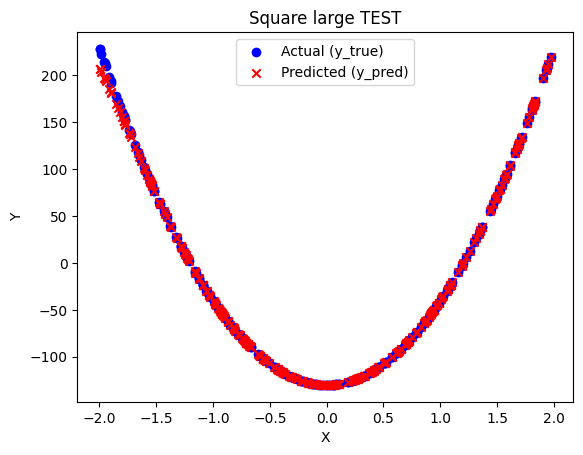

In [755]:
plot_scatter(X_test_sq_l, y_test_sq_l, net_sq_l.feedforward(X_test_sq_l), "Square large TEST")

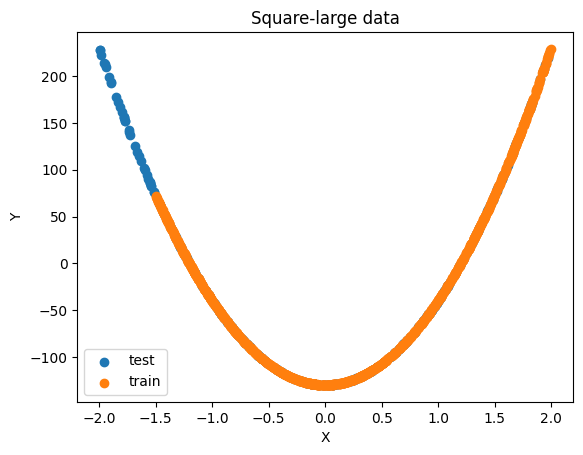

In [810]:
plot_two(X_test_sq_l, y_test_sq_l, X_train_sq_l, y_train_sq_l, "Square-large data")

Jak widzimy, mimo bardzo długiego trenowania ze względu na trudny zbiór (lewa część zbioru treningowego nie jest w stanie sie wytrenowac na tyle dobrze w sensownym czasie, ze względu na braki wartości gdzie zbiór testowy je ma), cieżko otrzymać na zbiorze testowym MSE tak małego jak na zbiorze treningowym.

Aczkolwiek mimo wszystko całkiem dobrze lewa strona wytrenowała się już na danych treningowych, zapewne trzeba by jeszcze więcej czasu aby MSE testowego było zbliżone do MSE treningowego

In [751]:
net_sq_l_moment = Network([1,5,5,1], "sigmoid")

In [752]:
net_sq_l_moment.generate_weights("he")
net_sq_l_moment.generate_biases("zeros")

In [753]:
net_sq_l_moment.train(X_train_sq_l, y_train_sq_l, 100, 0.001, 10000,method="moment", shuffle=True,X_test = X_test_sq_l, Y_test=y_test_sq_l, alpha=0.9)

Epoch 0 complete, mse: 8602.963858047202
Epoch 1 complete, mse: 8385.9532214273
Epoch 2 complete, mse: 7990.915641055238
Epoch 3 complete, mse: 7476.914546806003
Epoch 4 complete, mse: 6973.540397441752
Epoch 5 complete, mse: 6269.518357358608
Epoch 6 complete, mse: 5721.195829693973
Epoch 7 complete, mse: 5059.32995161258
Epoch 8 complete, mse: 4665.253362843883
Epoch 9 complete, mse: 4020.5707287965542
Epoch 10 complete, mse: 3638.899528201416
Epoch 11 complete, mse: 3386.946045986148
Epoch 12 complete, mse: 3136.1983345826015
Epoch 13 complete, mse: 2962.1247201995466
Epoch 14 complete, mse: 2827.6862362892416
Epoch 15 complete, mse: 2721.285014855045
Epoch 16 complete, mse: 2682.9554027606746
Epoch 17 complete, mse: 2555.3231255776864
Epoch 18 complete, mse: 2489.2365708691837
Epoch 19 complete, mse: 2434.3848750245693
Epoch 20 complete, mse: 2369.6223362809505
Epoch 21 complete, mse: 2294.881059302769
Epoch 22 complete, mse: 2215.0853166281067
Epoch 23 complete, mse: 2047.81241698

29.641616476284103

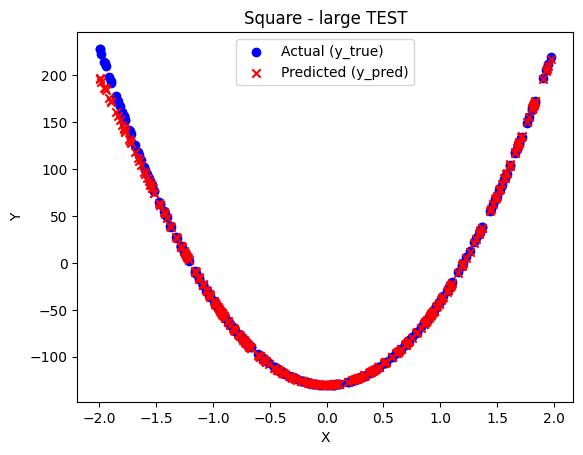

In [756]:
plot_scatter(X_test_sq_l, y_test_sq_l, net_sq_l_moment.feedforward(X_test_sq_l), "Square - large TEST")

### Porównanie zwykłego SGD, SGD z momentem, SGD z normalizacją gradientu RMSProp

##### Zbiór steps-large

In [654]:
net_st_l_sgd_for_compare = Network([1,5,5,5,1], "sigmoid")

In [655]:
net_st_l_sgd_for_compare.generate_weights("uniform")
net_st_l_sgd_for_compare.generate_biases("zeros")

In [656]:
net_st_l_sgd_for_compare.set_custom_weights([np.array([[-0.46877406,  0.1481068 ,  0.0743145 , -0.25701425,  0.35461943]]),
 np.array([[-0.78159919,  0.02181711,  0.40321493, -0.42057349,  0.0718858 ],
        [ 0.05109753, -0.52456599,  0.06916659, -0.26111818, -0.90652252],
        [ 0.21226921, -0.03300131,  0.67275085, -0.18572837, -0.69993675],
        [ 0.45767494, -0.25668845,  0.18190462, -0.02088095,  0.72331314],
        [ 0.15439103,  0.02903356, -0.1922479 , -0.51642629, -0.15105768]]),
 np.array([[-0.49259612, -0.33671866, -0.92100037, -0.19457837, -0.00532013],
        [-0.19773916, -0.80710978,  0.06451981,  0.06026531, -0.19836837],
        [-0.42231679,  0.13295915, -0.23409658, -0.1998103 ,  0.43109416],
        [-0.79771602,  0.63339822, -0.14663176,  0.47930734, -0.24613944],
        [ 0.45797015, -0.43053628,  0.52302023, -0.18518758,  0.47783798]]),
 np.array([[ 0.2809866 ],
        [ 0.50976187],
        [ 0.38294141],
        [-0.17240981],
        [-0.49974134]])])

In [657]:
net_st_l_sgd_for_compare.train(X_train_st_l, y_train_st_l, 100, 0.01, 1000, shuffle=False, X_test = X_test_st_l, Y_test=y_test_st_l, alpha=0.9)

Epoch 0 complete, mse: 6145.6815224044385
Epoch 1 complete, mse: 2807.7433676164655
Epoch 2 complete, mse: 1249.3861608270136
Epoch 3 complete, mse: 1099.6179909641037
Epoch 4 complete, mse: 864.4242076599182
Epoch 5 complete, mse: 744.0684927399911
Epoch 6 complete, mse: 674.1610615241535
Epoch 7 complete, mse: 631.6038562614528
Epoch 8 complete, mse: 603.946235880102
Epoch 9 complete, mse: 584.6333502128566
Epoch 10 complete, mse: 570.0316968211929
Epoch 11 complete, mse: 558.1486486167356
Epoch 12 complete, mse: 547.9299395763436
Epoch 13 complete, mse: 538.8427511125112
Epoch 14 complete, mse: 530.6277343082128
Epoch 15 complete, mse: 523.1582130075327
Epoch 16 complete, mse: 516.3657434672554
Epoch 17 complete, mse: 510.2039602252381
Epoch 18 complete, mse: 504.6327651372777
Epoch 19 complete, mse: 499.6124508660149
Epoch 20 complete, mse: 495.10224356289086
Epoch 21 complete, mse: 491.06057386215656
Epoch 22 complete, mse: 487.4458686808106
Epoch 23 complete, mse: 484.21737512193

24.377657169788186

In [661]:
net_st_l_moment_for_compare = Network([1,5,5,5,1], "sigmoid")

In [662]:
net_st_l_moment_for_compare.generate_weights("uniform")
net_st_l_moment_for_compare.generate_biases("zeros")

In [663]:
net_st_l_moment_for_compare.set_custom_weights([np.array([[-0.46877406,  0.1481068 ,  0.0743145 , -0.25701425,  0.35461943]]),
 np.array([[-0.78159919,  0.02181711,  0.40321493, -0.42057349,  0.0718858 ],
        [ 0.05109753, -0.52456599,  0.06916659, -0.26111818, -0.90652252],
        [ 0.21226921, -0.03300131,  0.67275085, -0.18572837, -0.69993675],
        [ 0.45767494, -0.25668845,  0.18190462, -0.02088095,  0.72331314],
        [ 0.15439103,  0.02903356, -0.1922479 , -0.51642629, -0.15105768]]),
 np.array([[-0.49259612, -0.33671866, -0.92100037, -0.19457837, -0.00532013],
        [-0.19773916, -0.80710978,  0.06451981,  0.06026531, -0.19836837],
        [-0.42231679,  0.13295915, -0.23409658, -0.1998103 ,  0.43109416],
        [-0.79771602,  0.63339822, -0.14663176,  0.47930734, -0.24613944],
        [ 0.45797015, -0.43053628,  0.52302023, -0.18518758,  0.47783798]]),
 np.array([[ 0.2809866 ],
        [ 0.50976187],
        [ 0.38294141],
        [-0.17240981],
        [-0.49974134]])])

In [664]:
net_st_l_moment_for_compare.train(X_train_st_l, y_train_st_l, 100, 0.01, 1000, shuffle=False,method="moment", X_test = X_test_st_l, Y_test=y_test_st_l, alpha=0.9)

Epoch 0 complete, mse: 1481.1409123213887
Epoch 1 complete, mse: 815.561539391051
Epoch 2 complete, mse: 651.6287707785389
Epoch 3 complete, mse: 560.1955098214451
Epoch 4 complete, mse: 492.94961390332645
Epoch 5 complete, mse: 476.51023458627753
Epoch 6 complete, mse: 467.1661169324947
Epoch 7 complete, mse: 452.6997513277268
Epoch 8 complete, mse: 428.7240649106212
Epoch 9 complete, mse: 403.9044865883059
Epoch 10 complete, mse: 386.53782280063876
Epoch 11 complete, mse: 364.95058128709167
Epoch 12 complete, mse: 342.64389237363355
Epoch 13 complete, mse: 318.24949438171444
Epoch 14 complete, mse: 291.3703310110523
Epoch 15 complete, mse: 266.3031596914409
Epoch 16 complete, mse: 244.62430779728024
Epoch 17 complete, mse: 226.02226026572083
Epoch 18 complete, mse: 209.66460941337974
Epoch 19 complete, mse: 194.92745453186927
Epoch 20 complete, mse: 181.83769511649402
Epoch 21 complete, mse: 170.76225647805737
Epoch 22 complete, mse: 161.58244893944217
Epoch 23 complete, mse: 153.527

10.693934949305868

In [665]:
net_st_l_RMS_for_compare = Network([1,5,5,5,1], "sigmoid")

In [666]:
net_st_l_RMS_for_compare.generate_weights("uniform")
net_st_l_RMS_for_compare.generate_biases("zeros")

In [667]:
net_st_l_RMS_for_compare.set_custom_weights([np.array([[-0.46877406,  0.1481068 ,  0.0743145 , -0.25701425,  0.35461943]]),
 np.array([[-0.78159919,  0.02181711,  0.40321493, -0.42057349,  0.0718858 ],
        [ 0.05109753, -0.52456599,  0.06916659, -0.26111818, -0.90652252],
        [ 0.21226921, -0.03300131,  0.67275085, -0.18572837, -0.69993675],
        [ 0.45767494, -0.25668845,  0.18190462, -0.02088095,  0.72331314],
        [ 0.15439103,  0.02903356, -0.1922479 , -0.51642629, -0.15105768]]),
 np.array([[-0.49259612, -0.33671866, -0.92100037, -0.19457837, -0.00532013],
        [-0.19773916, -0.80710978,  0.06451981,  0.06026531, -0.19836837],
        [-0.42231679,  0.13295915, -0.23409658, -0.1998103 ,  0.43109416],
        [-0.79771602,  0.63339822, -0.14663176,  0.47930734, -0.24613944],
        [ 0.45797015, -0.43053628,  0.52302023, -0.18518758,  0.47783798]]),
 np.array([[ 0.2809866 ],
        [ 0.50976187],
        [ 0.38294141],
        [-0.17240981],
        [-0.49974134]])])

In [668]:
net_st_l_RMS_for_compare.train(X_train_st_l, y_train_st_l, 100, 0.01, 1000, shuffle=False,method="RMSProp", X_test = X_test_st_l, Y_test=y_test_st_l, alpha=0.9)

Epoch 0 complete, mse: 637.0324847688391
Epoch 1 complete, mse: 548.1270725748961
Epoch 2 complete, mse: 526.6323797265122
Epoch 3 complete, mse: 519.1415117390276
Epoch 4 complete, mse: 515.8103969445957
Epoch 5 complete, mse: 514.0960240427121
Epoch 6 complete, mse: 513.104877195479
Epoch 7 complete, mse: 512.4628645361595
Epoch 8 complete, mse: 511.99515898438244
Epoch 9 complete, mse: 511.61393689093796
Epoch 10 complete, mse: 511.2729641277271
Epoch 11 complete, mse: 510.94724292322536
Epoch 12 complete, mse: 510.6231621232413
Epoch 13 complete, mse: 510.29343868648505
Epoch 14 complete, mse: 509.95439483533085
Epoch 15 complete, mse: 509.6044361610361
Epoch 16 complete, mse: 509.2431747096773
Epoch 17 complete, mse: 508.8709111281809
Epoch 18 complete, mse: 508.48832274684065
Epoch 19 complete, mse: 508.0962727307107
Epoch 20 complete, mse: 507.69569186473814
Epoch 21 complete, mse: 507.28750462527574
Epoch 22 complete, mse: 506.8725825805422
Epoch 23 complete, mse: 506.451714777

10.42819790054212

In [673]:
mse_sgd = pd.DataFrame(net_st_l_sgd_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])
mse_moment= pd.DataFrame(net_st_l_moment_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])
mse_RMS = pd.DataFrame(net_st_l_RMS_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])

In [674]:
mse_list = [(mse_sgd, 'SGD'), (mse_moment, 'Moment'), (mse_RMS, 'RMSProp')]

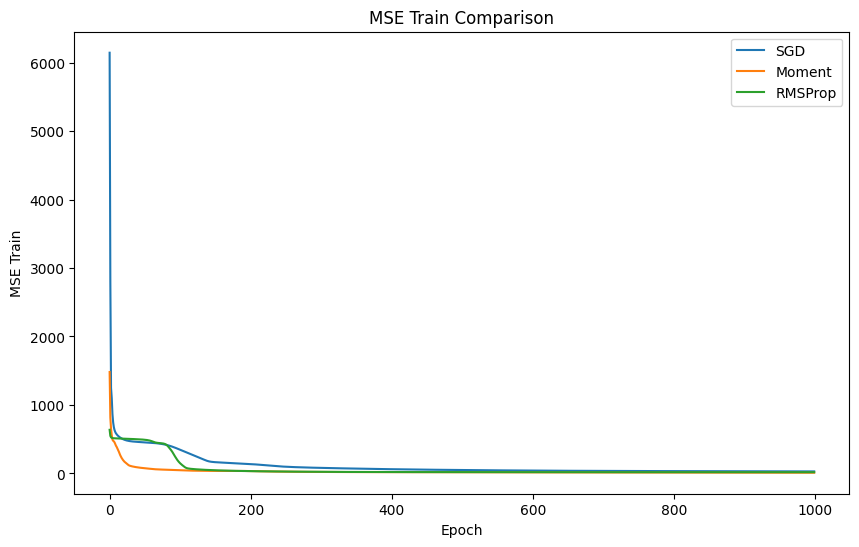

In [675]:
plot_multiple_mse(mse_list)

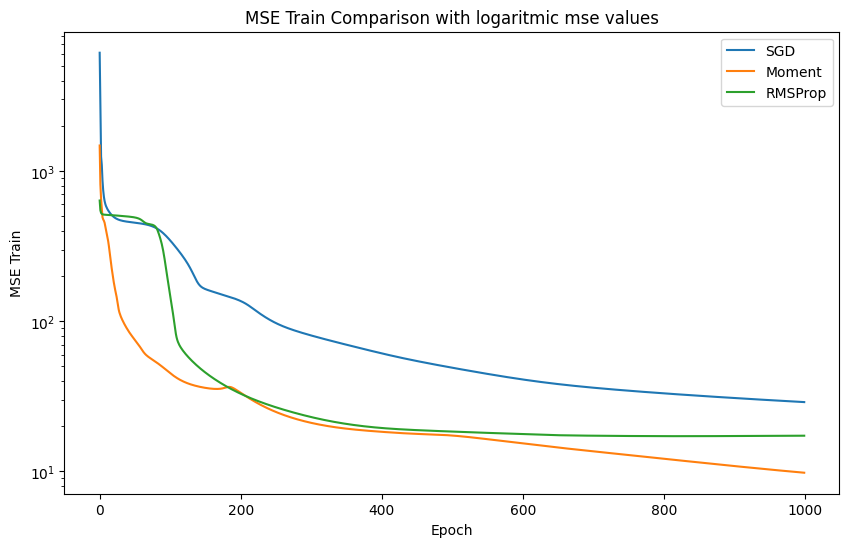

In [676]:
plot_multiple_mse_log(mse_list)

Widzimy, że najlepiej radzi sobie trenowanie z momentem. RMSProp od pewnego momentu bardzo zwolnił. Natomiast samo SGD zbiega, ale o wiele wolniej niż z 2 pozostałymi metodami

##### Multimodal

In [786]:
net_mm_l_sgd_for_compare = Network([1,10,1], "sigmoid")

In [787]:
net_mm_l_sgd_for_compare.generate_weights("he")
net_mm_l_sgd_for_compare.generate_biases("zeros")

In [788]:
net_mm_l_sgd_for_compare.weights_0

[array([[-0.40799086,  0.06129448,  0.16986571,  0.29885031, -0.38937074,
         -0.67800409,  0.97995819, -0.86590125,  0.02579793,  0.23960709]]),
 array([[-0.07074922],
        [ 0.25592942],
        [-0.24554852],
        [-0.58151469],
        [ 0.06572595],
        [-0.79220705],
        [-0.6764007 ],
        [ 0.52005066],
        [-0.04996749],
        [-0.50477192]])]

In [789]:
net_mm_l_sgd_for_compare.train(X_train_mm_l, y_train_mm_l, 100, 0.001, 1000, shuffle=False, X_test = X_test_mm_l, Y_test=y_test_mm_l, alpha=0.9)

Epoch 0 complete, mse: 4455.858485817856
Epoch 1 complete, mse: 4264.727180777891
Epoch 2 complete, mse: 4163.248269460837
Epoch 3 complete, mse: 4053.356664061222
Epoch 4 complete, mse: 3932.3355155921818
Epoch 5 complete, mse: 3803.5965739891462
Epoch 6 complete, mse: 3671.054952821313
Epoch 7 complete, mse: 3538.0454555849597
Epoch 8 complete, mse: 3406.993407844551
Epoch 9 complete, mse: 3279.585926765312
Epoch 10 complete, mse: 3157.1474093026472
Epoch 11 complete, mse: 3040.957378218499
Epoch 12 complete, mse: 2932.379836220623
Epoch 13 complete, mse: 2832.7860469090274
Epoch 14 complete, mse: 2743.3356364233555
Epoch 15 complete, mse: 2664.7364693534732
Epoch 16 complete, mse: 2597.0993651232484
Epoch 17 complete, mse: 2539.938383356896
Epoch 18 complete, mse: 2492.293113390638
Epoch 19 complete, mse: 2452.9114679197464
Epoch 20 complete, mse: 2420.4332810214673
Epoch 21 complete, mse: 2393.536807541751
Epoch 22 complete, mse: 2371.03403774458
Epoch 23 complete, mse: 2351.917798

514.4821069817956

In [790]:
net_mm_l_moment_for_compare = Network([1,10,1], "sigmoid")

In [791]:
net_mm_l_moment_for_compare.generate_weights("he")
net_mm_l_moment_for_compare.generate_biases("zeros")

In [792]:
net_mm_l_moment_for_compare.set_custom_weights([np.array([[-0.40799086,  0.06129448,  0.16986571,  0.29885031, -0.38937074,
         -0.67800409,  0.97995819, -0.86590125,  0.02579793,  0.23960709]]),
 np.array([[-0.07074922],
        [ 0.25592942],
        [-0.24554852],
        [-0.58151469],
        [ 0.06572595],
        [-0.79220705],
        [-0.6764007 ],
        [ 0.52005066],
        [-0.04996749],
        [-0.50477192]])])

In [793]:
net_mm_l_moment_for_compare.train(X_train_mm_l, y_train_mm_l, 100, 0.001, 1000, shuffle=False, method="moment",X_test = X_test_mm_l, Y_test=y_test_mm_l, alpha=0.9)

Epoch 0 complete, mse: 3684.335581727306
Epoch 1 complete, mse: 2729.6873122663433
Epoch 2 complete, mse: 2356.4591262603008
Epoch 3 complete, mse: 2258.3872379495397
Epoch 4 complete, mse: 2182.0582976798614
Epoch 5 complete, mse: 2121.6512035789983
Epoch 6 complete, mse: 2072.965405845833
Epoch 7 complete, mse: 2032.8933296883515
Epoch 8 complete, mse: 1999.3032411666572
Epoch 9 complete, mse: 1970.710360378649
Epoch 10 complete, mse: 1946.058420967403
Epoch 11 complete, mse: 1924.5774213103252
Epoch 12 complete, mse: 1905.6908323186115
Epoch 13 complete, mse: 1888.9553271433563
Epoch 14 complete, mse: 1874.0215574511685
Epoch 15 complete, mse: 1860.6082228850014
Epoch 16 complete, mse: 1848.4843278673225
Epoch 17 complete, mse: 1837.4563170588112
Epoch 18 complete, mse: 1827.3578923635253
Epoch 19 complete, mse: 1818.0408799150869
Epoch 20 complete, mse: 1809.365620098124
Epoch 21 complete, mse: 1801.1889973898508
Epoch 22 complete, mse: 1793.3473132924878
Epoch 23 complete, mse: 17

176.59492474126617

In [794]:
net_mm_l_RMSProp_for_compare = Network([1,10,1], "sigmoid")

In [795]:
net_mm_l_RMSProp_for_compare.generate_weights("he")
net_mm_l_RMSProp_for_compare.generate_biases("zeros")

In [796]:
net_mm_l_RMSProp_for_compare.set_custom_weights([np.array([[-0.40799086,  0.06129448,  0.16986571,  0.29885031, -0.38937074,
         -0.67800409,  0.97995819, -0.86590125,  0.02579793,  0.23960709]]),
 np.array([[-0.07074922],
        [ 0.25592942],
        [-0.24554852],
        [-0.58151469],
        [ 0.06572595],
        [-0.79220705],
        [-0.6764007 ],
        [ 0.52005066],
        [-0.04996749],
        [-0.50477192]])])

In [797]:
net_mm_l_RMSProp_for_compare.train(X_train_mm_l, y_train_mm_l, 100, 0.001, 1000, shuffle=False, method="RMSProp",X_test = X_test_mm_l, Y_test=y_test_mm_l, alpha=0.9)

Epoch 0 complete, mse: 6526.610901598812
Epoch 1 complete, mse: 5349.673107081207
Epoch 2 complete, mse: 4879.288640690314
Epoch 3 complete, mse: 4578.584767340454
Epoch 4 complete, mse: 4409.366377523016
Epoch 5 complete, mse: 4330.723529130435
Epoch 6 complete, mse: 4289.1005545915705
Epoch 7 complete, mse: 4252.440195685372
Epoch 8 complete, mse: 4213.837954437641
Epoch 9 complete, mse: 4172.671194498532
Epoch 10 complete, mse: 4129.125962815282
Epoch 11 complete, mse: 4083.460468964949
Epoch 12 complete, mse: 4035.9228886994497
Epoch 13 complete, mse: 3986.744454139521
Epoch 14 complete, mse: 3936.137279846687
Epoch 15 complete, mse: 3884.2891056038925
Epoch 16 complete, mse: 3831.3555543212146
Epoch 17 complete, mse: 3777.452021417425
Epoch 18 complete, mse: 3722.6477145954736
Epoch 19 complete, mse: 3666.95082154573
Epoch 20 complete, mse: 3610.2245641546697
Epoch 21 complete, mse: 3552.390507820101
Epoch 22 complete, mse: 3493.4135670073592
Epoch 23 complete, mse: 3433.306443290

236.80670715552785

In [798]:
mse_sgd = pd.DataFrame(net_mm_l_sgd_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])
mse_moment= pd.DataFrame(net_mm_l_moment_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])
mse_RMS = pd.DataFrame(net_mm_l_RMSProp_for_compare.mse_history, columns=['Epoch', 'MSE_Train'])

In [799]:
mse_list = [(mse_sgd, 'SGD'), (mse_moment, 'Moment'), (mse_RMS, 'RMSProp')]

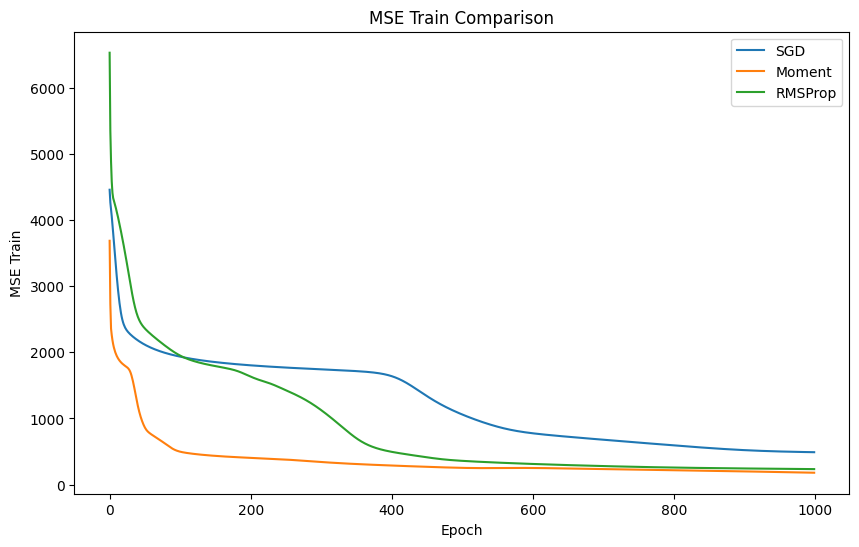

In [800]:
plot_multiple_mse(mse_list)

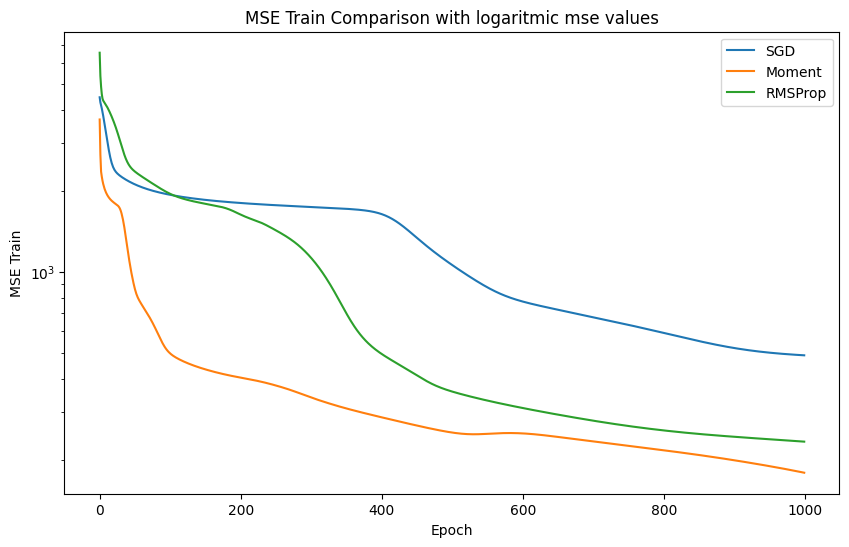

In [801]:
plot_multiple_mse_log(mse_list)

W tym przypadku również najlepiej poradziło sobie uczenie gradientowe z momentem. RMSProp poradził sobie w tym przypadku niewiele gorzej. Natomiast - co nie dziwne - samo uczenie gradientowe bez dodatkowych metod radzi sobie dużo gorzej - wciąż zbiega jednak o wiele wolniej.